<a href="https://colab.research.google.com/github/Rachit23110261/ML_ASSIGNMENT_2_23110261_23110189_23110306/blob/main/Task4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [4]:
import os

In [5]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

--2024-09-20 09:42:47--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 18.65.39.48, 18.65.39.29, 18.65.39.42, ...
Connecting to segment-anything.com (segment-anything.com)|18.65.39.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.02s   

2024-09-20 09:42:48 (14.1 MB/s) - ‘dog.jpg’ saved [221810/221810]



torch.Size([3, 1365, 2048])


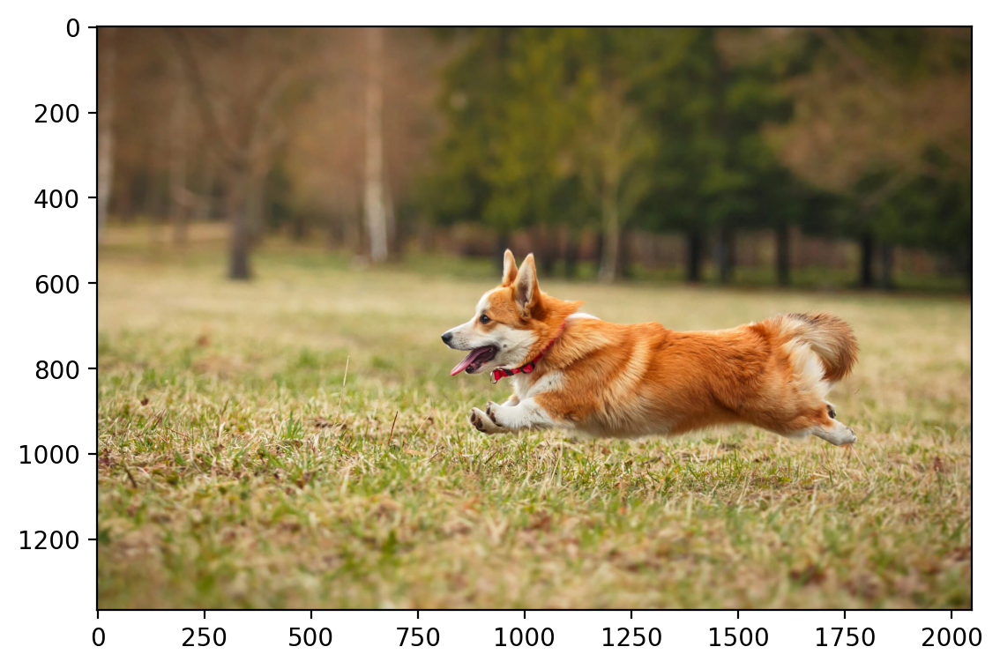

In [6]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)
torch.Size([3, 1365, 2048])
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [7]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [8]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [9]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [10]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

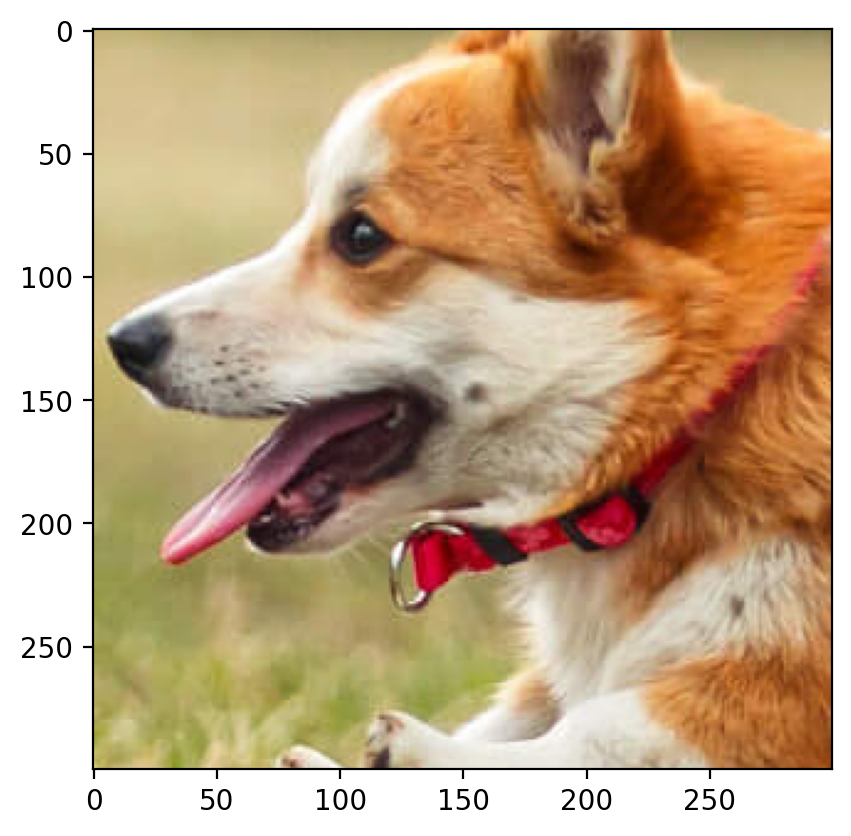

In [11]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [12]:
crop = crop.to(device)
crop.shape

torch.Size([3, 300, 300])

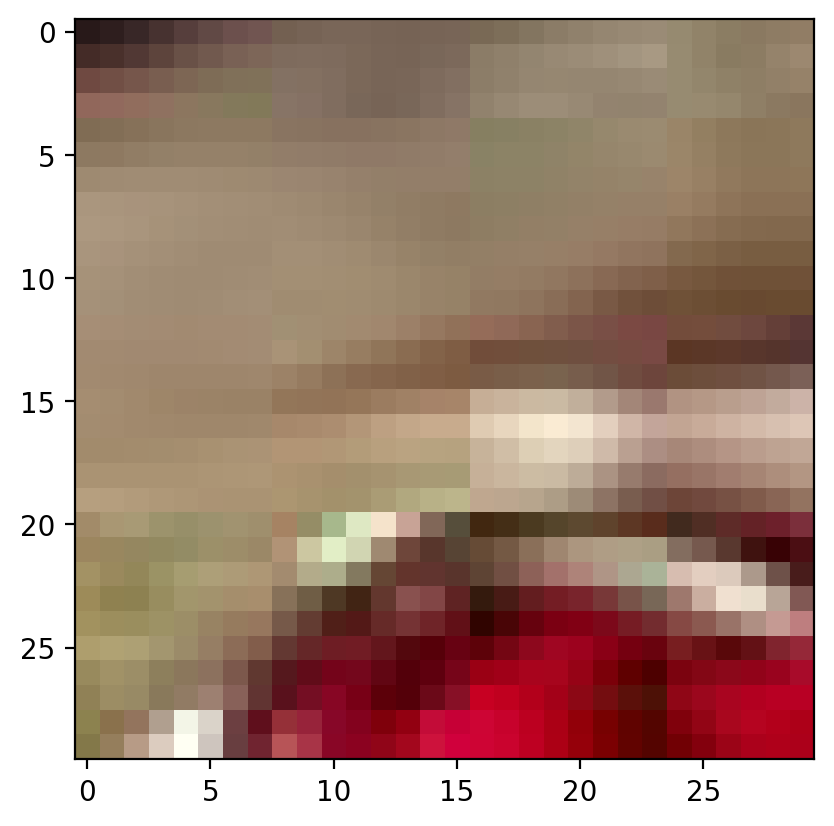

In [13]:
r = crop[:,180:210,120:150]
plt.imshow(rearrange(r, 'c h w -> h w c').cpu().numpy())

In [14]:
new_arr = crop.reshape(-1,crop.shape[-1])
new_arr

tensor([[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
        [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
        [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
        ...,
        [0.4549, 0.3922, 0.3529,  ..., 0.0784, 0.0667, 0.0510],
        [0.5216, 0.4510, 0.3961,  ..., 0.0784, 0.0471, 0.0353],
        [0.5725, 0.5020, 0.4314,  ..., 0.0863, 0.0392, 0.0392]],
       dtype=torch.float64)

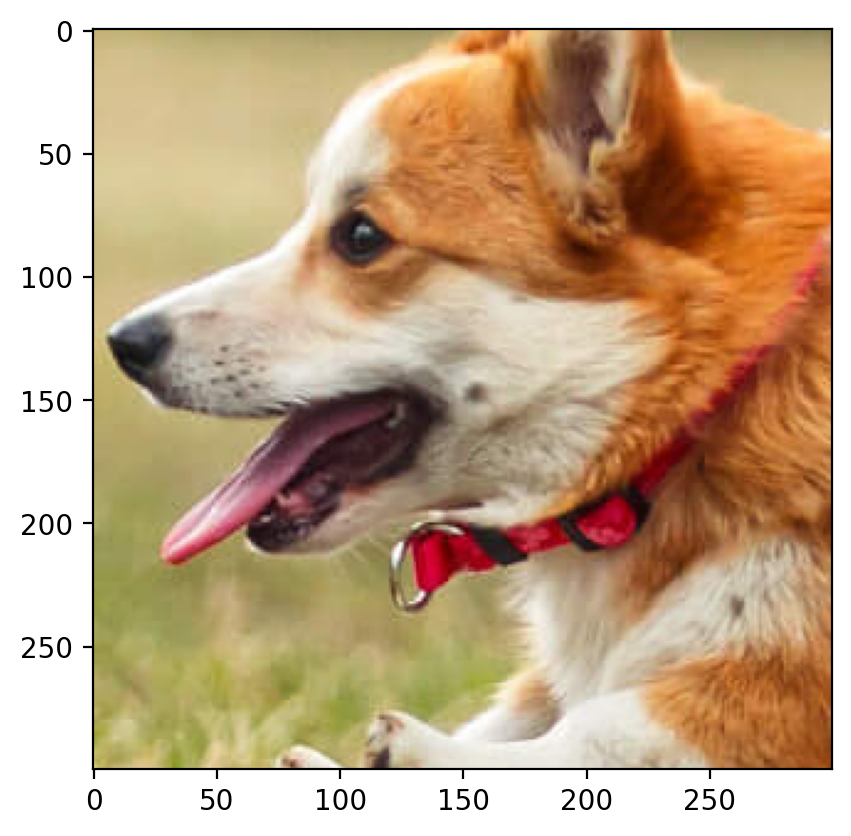

In [15]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [16]:
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix A into W and H
    A: input matrix of size (n_users, n_movies)
    k: number of latent features

    Returns W and H
    W: matrix of size (n_users, k)
    H: matrix of size (k, n_movies)
    """
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)

    optimizer = optim.Adam([W, H], lr=0.01)

    for i in range(1000):
        loss = torch.norm(torch.mm(W, H) - A)

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

    return W, H, loss

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math

def compute_rmse(original, reconstructed):
    """Compute the Root Mean Square Error between the original and reconstructed images."""
    return torch.sqrt(((original - reconstructed) ** 2).mean()).item()

def compute_psnr(original, reconstructed, max_pixel_value=1.0):
    """Compute the Peak Signal-to-Noise Ratio between the original and reconstructed images."""
    mse = torch.mean((original - reconstructed) ** 2).item()
    if mse == 0:
        return float('inf')
    return 20 * np.log10(max_pixel_value / np.sqrt(mse))

In [18]:
def factorize(A, k, device=torch.device("cpu")):
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return W, H, loss
def mask_image(img, prop):
    img_copy = img.clone()
    mask = torch.rand(img.shape[1:]) < prop
    mask_rgb = mask.unsqueeze(0).repeat(img.shape[0], 1, 1)
    img_copy[mask_rgb] = float('nan')
    mask_rgb = mask_rgb.to(device)
    img_copy = img_copy.to(device)
    return img_copy, mask_rgb

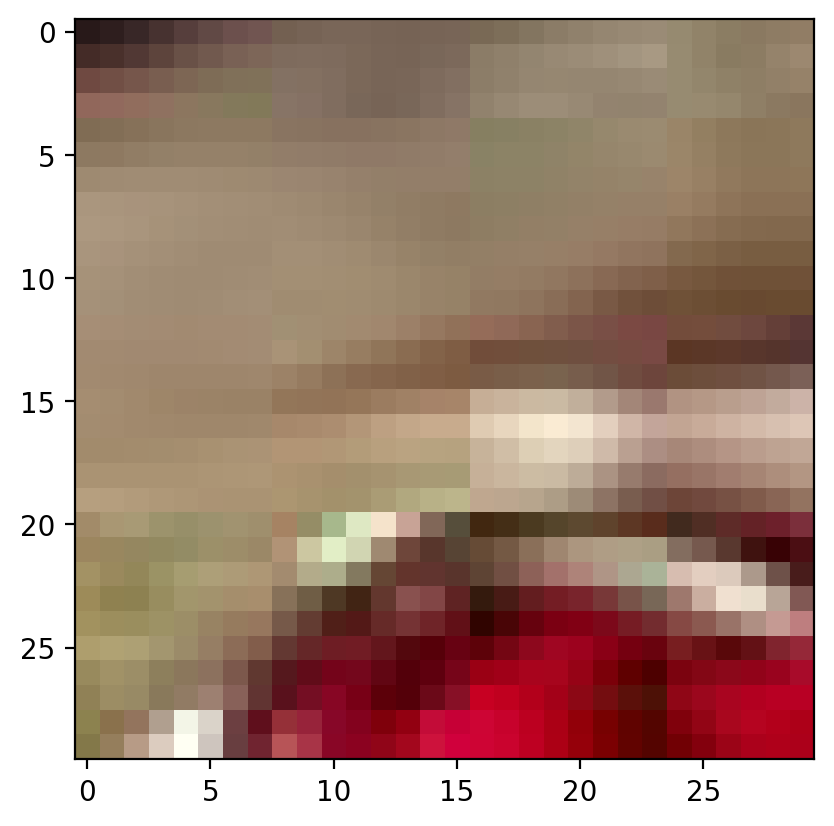

In [19]:
r = crop[:,180:210,120:150]
plt.imshow(rearrange(r, 'c h w -> h w c').cpu().numpy())

In [20]:
t = crop


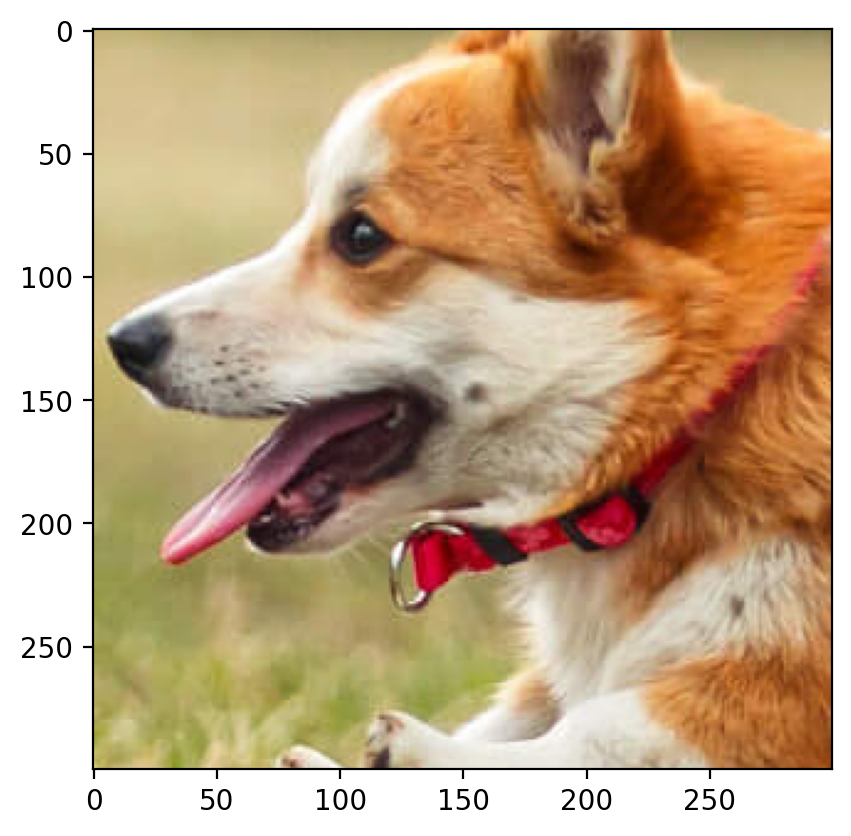

In [21]:
plt.imshow(rearrange(t, 'c h w -> h w c').cpu().numpy())

In [22]:
def compress_and_reconstruct(original_array, ranks, device=torch.device("cpu")):
    flattened_patch = original_array.reshape(-1, original_array.shape[-1])

    for r in ranks:
        print(f"\nLow-rank approximation with r = {r}")

        # Apply matrix factorization for each channel
        W1, H1, loss1 = factorize(original_array[0, :, :], r, device)
        W2, H2, loss2 = factorize(original_array[1, :, :], r, device)
        W3, H3, loss3 = factorize(original_array[2, :, :], r, device)

        # Reconstruct the images for each channel
        reconstructed_array_1 = torch.mm(W1, H1)
        reconstructed_array_2 = torch.mm(W2, H2)
        reconstructed_array_3 = torch.mm(W3, H3)

        # Stack the reconstructed channels
        new_array = torch.stack([reconstructed_array_1, reconstructed_array_2, reconstructed_array_3], dim=0)

        # Normalize the reconstructed image
        new_array = new_array - new_array.min()  # Ensure the minimum value is 0
        new_array = new_array / new_array.max()  # Normalize to [0, 1]

        # Create a figure with 2 subplots
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        rmse = compute_rmse(original_array, new_array)
        psnr = compute_psnr(original_array, new_array)

        print(f"RMSE for r = {r}: {rmse:.4f}")
        print(f"PSNR for r = {r}: {psnr:.2f} dB")

        # Plot the original image
        axes[0].imshow(rearrange(original_array, 'c h w -> h w c').cpu().numpy())
        axes[0].set_title("Original Patch")

        # Plot the reconstructed image
        axes[1].imshow(rearrange(new_array, 'c h w -> h w c').detach().numpy())
        axes[1].set_title(f"Reconstructed Patch - r={r}")
        plt.show()


In [23]:
crop.shape

torch.Size([3, 300, 300])

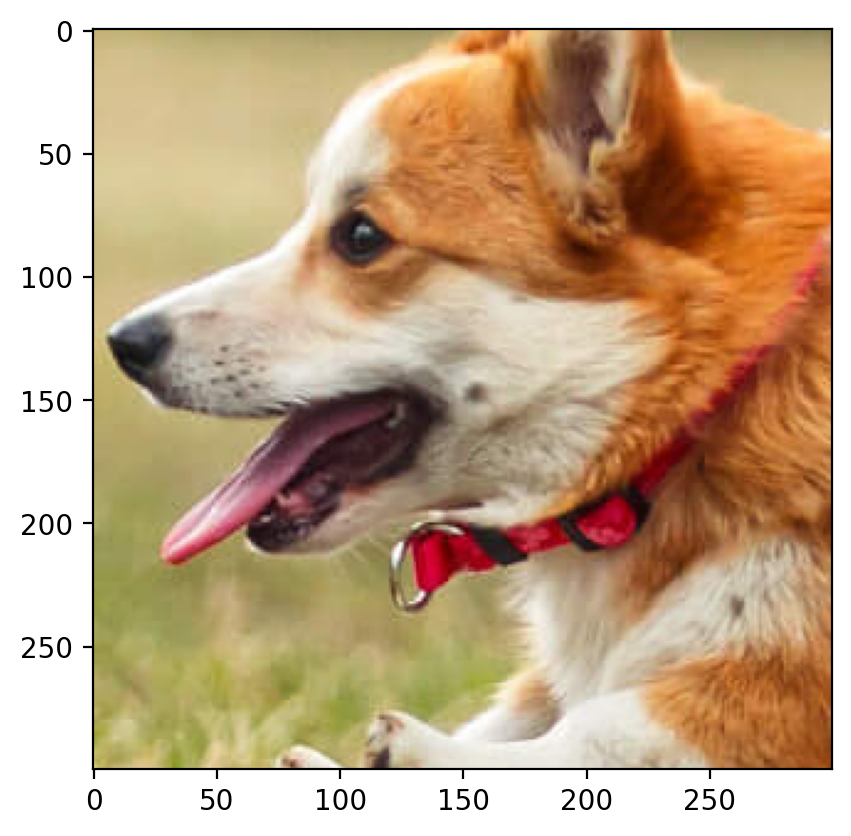

In [24]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())


Low-rank approximation with r = 5
RMSE for r = 5: 0.1234
PSNR for r = 5: 18.17 dB


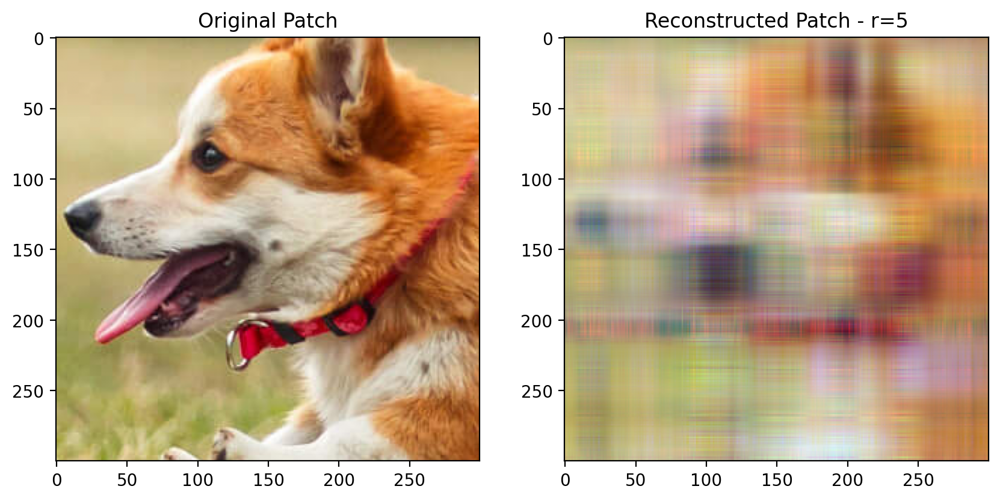


Low-rank approximation with r = 50
RMSE for r = 50: 0.0554
PSNR for r = 50: 25.14 dB


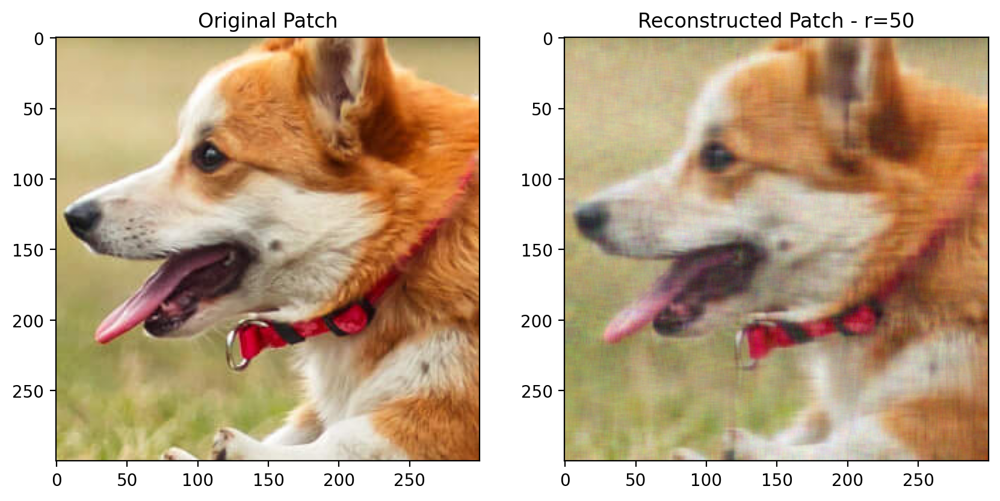


Low-rank approximation with r = 100
RMSE for r = 100: 0.0482
PSNR for r = 100: 26.35 dB


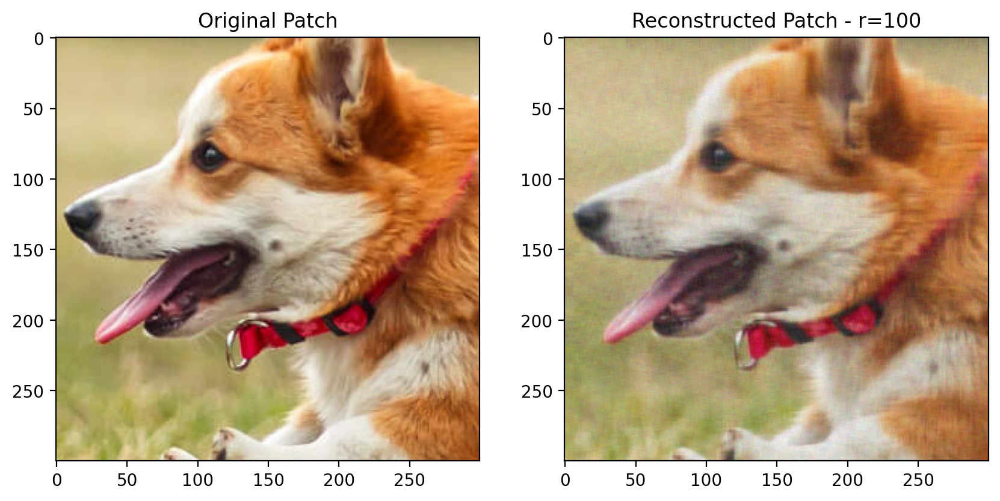


Low-rank approximation with r = 150
RMSE for r = 150: 0.0369
PSNR for r = 150: 28.66 dB


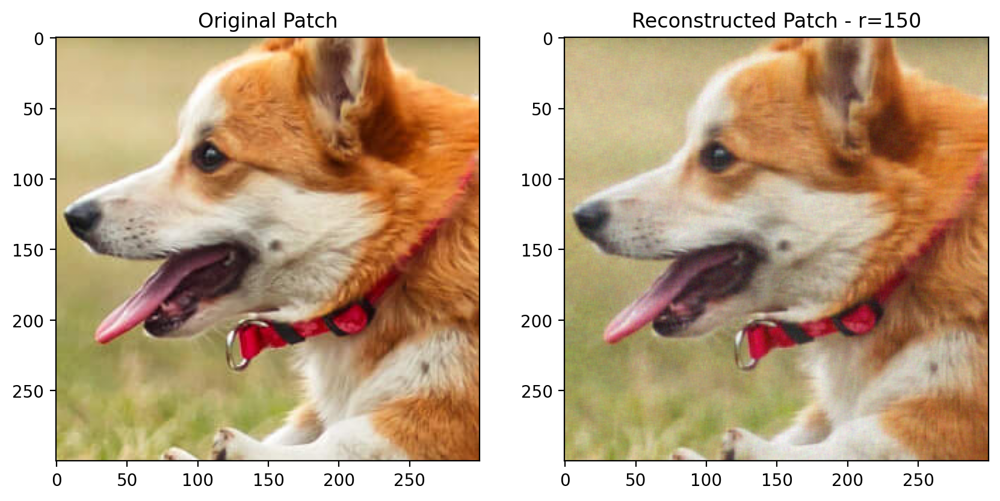

In [25]:
compress_and_reconstruct(crop, [5,50,100,150], device=torch.device("cpu"))

In [26]:
import torch
import numpy as np


region = crop.clone()

region_flat = region.reshape(-1)

num_pixels_to_mask = 900
indices_to_mask = np.random.choice(region_flat.numel(), num_pixels_to_mask, replace=False)

region_flat[indices_to_mask] = float('nan')

region_masked = region_flat.reshape(region.shape)

crop = region_masked


In [27]:
# Modify the loss function to ignore NaN values

def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

    return W, H, loss

In [28]:
import torch
import numpy as np

def compute_rmse(original, reconstructed):
    """Compute the Root Mean Square Error between the original and reconstructed images, ignoring NaN values."""
    mask = ~torch.isnan(original) & ~torch.isnan(reconstructed)
    if mask.sum() == 0:
        return float('nan')
    return torch.sqrt(((original[mask] - reconstructed[mask]) ** 2).mean()).item()

def compute_psnr(original, reconstructed, max_pixel_value=1.0):
    """Compute the Peak Signal-to-Noise Ratio between the original and reconstructed images, ignoring NaN values."""
    mask = ~torch.isnan(original) & ~torch.isnan(reconstructed)
    if mask.sum() == 0:
        return float('nan')

    mse = torch.mean((original[mask] - reconstructed[mask]) ** 2).item()
    if mse == 0:
        return float('inf')
    return 20 * np.log10(max_pixel_value / np.sqrt(mse))



Low-rank approximation with r = 5
RMSE for r = 5: 0.1126
PSNR for r = 5: 18.97 dB


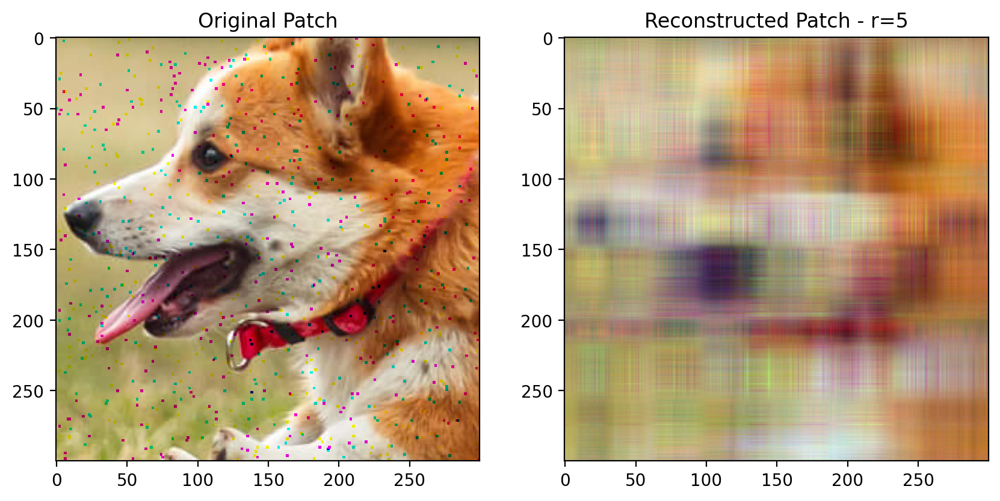


Low-rank approximation with r = 25
RMSE for r = 25: 0.0665
PSNR for r = 25: 23.54 dB


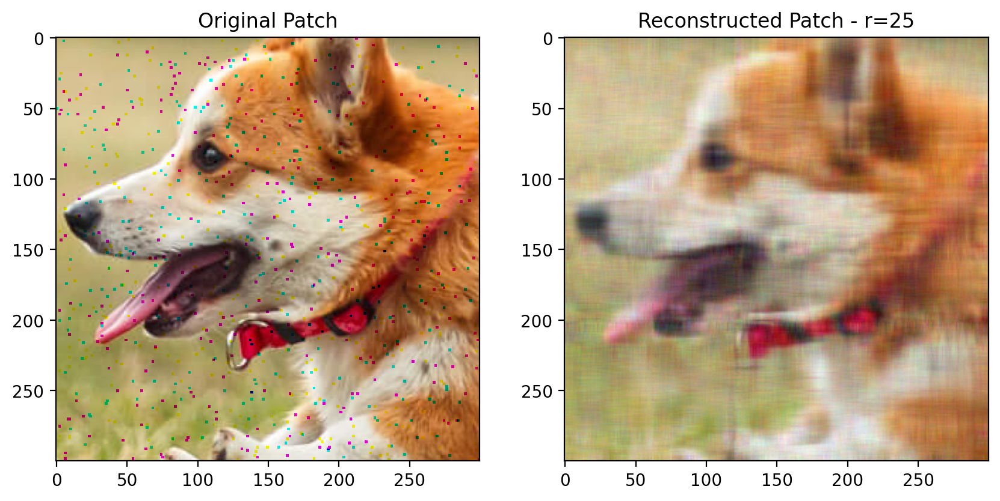


Low-rank approximation with r = 100
RMSE for r = 100: 0.0438
PSNR for r = 100: 27.17 dB


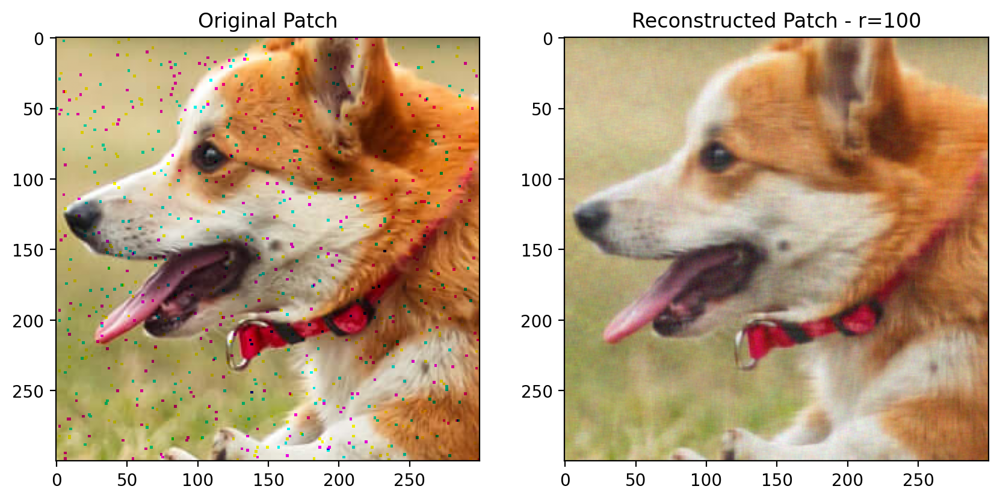


Low-rank approximation with r = 200
RMSE for r = 200: 0.0389
PSNR for r = 200: 28.21 dB


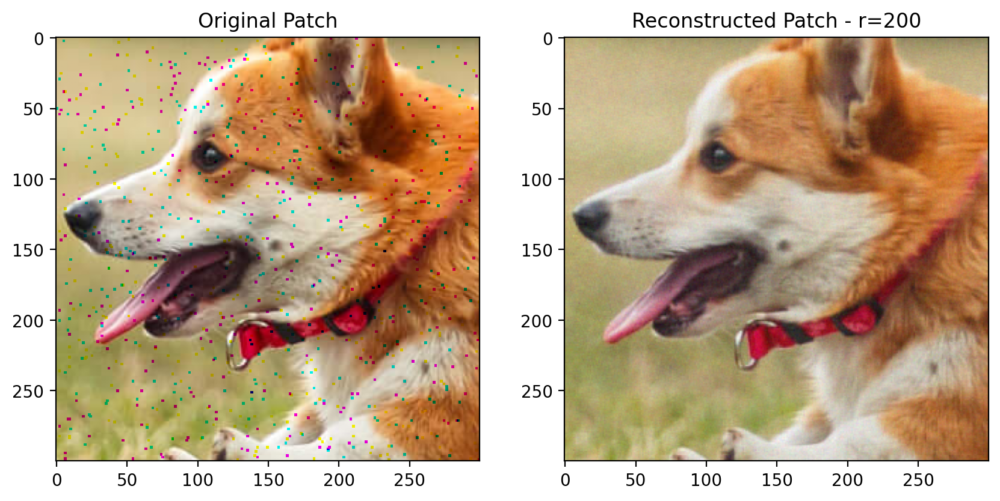

In [29]:
compress_and_reconstruct(crop, [5,25,100,200], device=torch.device("cpu"))

RFF RMSE: 0.0108, PSNR: 39.35 dB


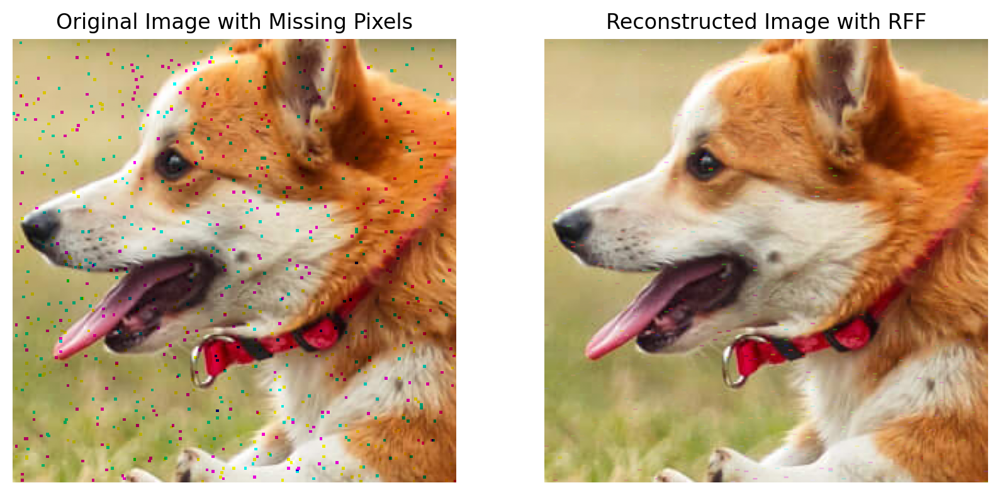

In [30]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

original_image = crop.clone()

def prepare_data(original_image):
    H, W = original_image.shape[1:3]
    coords = np.array([[h, w] for h in range(H) for w in range(W)])

    flattened_image = original_image.view(-1, 3)

    missing_indices = np.where(torch.isnan(flattened_image).any(dim=1))[0]

    return coords, flattened_image, missing_indices

def random_fourier_features(coords, num_features, gamma=0.1):
    np.random.seed(0)
    W = np.random.randn(2, num_features) * gamma
    b = 2 * np.pi * np.random.rand(num_features)
    fourier_features = np.cos(np.dot(coords, W) + b)
    return fourier_features

def reconstruct_with_rff(original_image, num_features=500, gamma=0.1):
    coords, flattened_image, missing_indices = prepare_data(original_image)

    fourier_features = random_fourier_features(coords, num_features, gamma)

    present_indices = np.where(~torch.isnan(flattened_image).any(dim=1))[0]
    if present_indices.size == 0:
        raise ValueError("No present pixels available for training.")

    X_train = fourier_features[present_indices]
    y_train = flattened_image[present_indices]


    model = LinearRegression()
    model.fit(X_train, y_train.numpy())


    X_missing = fourier_features[missing_indices]
    predicted_missing = model.predict(X_missing)


    reconstructed_image = flattened_image.clone()
    reconstructed_image[missing_indices] = torch.tensor(predicted_missing, dtype=flattened_image.dtype)

    return reconstructed_image.view(original_image.shape)


def compute_rmse(original, reconstructed):
    """Compute RMSE while ignoring NaN values."""
    mask = ~torch.isnan(original) & ~torch.isnan(reconstructed)
    if mask.sum() == 0:
        return float('inf')
    return torch.sqrt(((original[mask] - reconstructed[mask]) ** 2).mean()).item()

def compute_psnr(original, reconstructed, max_pixel_value=1.0):
    """Compute PSNR while ignoring NaN values."""
    mask = ~torch.isnan(original) & ~torch.isnan(reconstructed)
    if mask.sum() == 0:
        return float('inf')
    mse = torch.mean((original[mask] - reconstructed[mask]) ** 2).item()
    if mse == 0:
        return float('inf')
    return 20 * np.log10(max_pixel_value / np.sqrt(mse))

reconstructed_image_rff = reconstruct_with_rff(original_image)

rmse_rff = compute_rmse(original_image, reconstructed_image_rff)
psnr_rff = compute_psnr(original_image, reconstructed_image_rff)

print(f"RFF RMSE: {rmse_rff:.4f}, PSNR: {psnr_rff:.2f} dB")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(original_image.permute(1, 2, 0).numpy())
axes[0].set_title("Original Image with Missing Pixels")
axes[0].axis('off')

axes[1].imshow(reconstructed_image_rff.permute(1, 2, 0).numpy())
axes[1].set_title("Reconstructed Image with RFF")
axes[1].axis('off')

plt.show()
